# TRF solver comparison
# 1. Saturated case
## Benchmarkfile: Tests/Data/ThermoRichardsFlow/SimplifiedMechanics/TRuni_unsaturated.prj

In [1]:
from ogs6py.ogs import OGS

In [2]:
import pandas as pd

In [3]:
import numpy as np

In [4]:
import matplotlib.pyplot as plt

In [5]:
import plot_settings

In [6]:
directory = "../data/sims/TRF"

In [7]:
m = OGS()

PROJECT_FILE not given. Calling it default.prj.


In [8]:
def parse_jacobian(inputfile, petsc=True):
    Jac = {}
    Jacsize = 16
    validfirstcolumn = [str(i) for i in range(Jacsize+1)]
    for i in range(Jacsize):
        Jac[i] = {}
        for j in range(Jacsize):
            Jac[i][j] = []
    if petsc is True:
        offset = 1
    else:
        offset = 0
    with open(inputfile, 'r') as infile:
        for line in infile:
            linelist = line.split()
            try:
                if linelist[0] in validfirstcolumn:
                    Jac[int(linelist[0])-offset][int(linelist[1].split(":")[0])-offset].append(float(linelist[2]))
            except IndexError:
                    pass           
                
    return Jac        

### Read in STDOUT

In [9]:
output_eigen = m.parse_out(directory+"/TRuni_saturated_eigen.out")

In [10]:
output_petsc = m.parse_out(directory+"/TRuni_saturated_petsc.out", petsc=True)

In [11]:
output_eigen

,execution_time,time_step/number,time_step/t,time_step/dt,time_step/cpu_time,time_step/output_time,time_step/iteration_proc0/number,time_step/iteration_proc0/assembly_time,time_step/iteration_proc0/dirichlet_bc_time,time_step/iteration_proc0/linear_solver_time,time_step/iteration_proc0/cpu_time,time_step/iteration_proc0/component_convergence/number,time_step/iteration_proc0/component_convergence/dx,time_step/iteration_proc0/component_convergence/x,time_step/iteration_proc0/component_convergence/dx_relative
0,0.029942,1,0.1,0.1,0.001548,0.001025,1,0.000368,0.000008,None,0.000428,0,0.000000e+00,8.706100e+02,0.000000e+00
1,0.029942,1,0.1,0.1,0.001548,0.001025,1,0.000368,0.000008,None,0.000428,1,2.176000e+07,2.176000e+07,1.000000e+00
2,0.029942,1,0.1,0.1,0.001548,0.001025,2,0.000242,0.000006,None,0.000278,0,0.000000e+00,8.706100e+02,0.000000e+00
3,0.029942,1,0.1,0.1,0.001548,0.001025,2,0.000242,0.000006,None,0.000278,1,4.742500e+04,2.180700e+07,2.174800e-03
4,0.029942,1,0.1,0.1,0.001548,0.001025,3,0.000238,0.000005,None,0.000271,0,0.000000e+00,8.706100e+02,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.029942,10,1.0,0.1,0.001550,0.001024,3,0.000300,0.000006,None,0.000346,1,1.052500e+02,2.166700e+08,4.857500e-07
96,0.029942,10,1.0,0.1,0.001550,0.001024,4,0.000238,0.000005,None,0.000270,0,0.000000e+00,1.243700e+03,0.000000e+00
97,0.029942,10,1.0,0.1,0.001550,0.001024,4,0.000238,0.000005,None,0.000270,1,2.328300e-01,2.166700e+08,1.074500e-09
98,0.029942,10,1.0,0.1,0.001550,0.001024,5,0.000238,0.000005,None,0.000270,0,0.000000e+00,1.243700e+03,0.000000e+00


In [12]:
output_petsc

,execution_time,time_step/number,time_step/t,time_step/dt,time_step/cpu_time,time_step/output_time,time_step/iteration_proc0/number,time_step/iteration_proc0/assembly_time,time_step/iteration_proc0/dirichlet_bc_time,time_step/iteration_proc0/linear_solver_time,time_step/iteration_proc0/cpu_time,time_step/iteration_proc0/component_convergence/number,time_step/iteration_proc0/component_convergence/dx,time_step/iteration_proc0/component_convergence/x,time_step/iteration_proc0/component_convergence/dx_relative
0,0.10012,1,0.1,0.1,0.015216,0.001407,1,0.007289,0.000029,0.002305,0.009667,0,0.000000e+00,8.706100e+02,0.000000e+00
1,0.10012,1,0.1,0.1,0.015216,0.001407,1,0.007289,0.000029,0.002305,0.009667,1,2.176000e+07,2.176000e+07,1.000000e+00
2,0.10012,1,0.1,0.1,0.015216,0.001407,2,0.000854,0.000023,0.000445,0.001350,0,0.000000e+00,8.706100e+02,0.000000e+00
3,0.10012,1,0.1,0.1,0.015216,0.001407,2,0.000854,0.000023,0.000445,0.001350,1,4.742500e+04,2.180700e+07,2.174800e-03
4,0.10012,1,0.1,0.1,0.015216,0.001407,3,0.000861,0.000019,0.000465,0.001376,0,0.000000e+00,8.706100e+02,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.10012,10,1.0,0.1,0.007280,0.001249,3,0.000855,0.000020,0.000450,0.001355,1,1.052500e+02,2.166700e+08,4.857500e-07
96,0.10012,10,1.0,0.1,0.007280,0.001249,4,0.000872,0.000020,0.000470,0.001393,0,0.000000e+00,1.243700e+03,0.000000e+00
97,0.10012,10,1.0,0.1,0.007280,0.001249,4,0.000872,0.000020,0.000470,0.001393,1,2.328300e-01,2.166700e+08,1.074500e-09
98,0.10012,10,1.0,0.1,0.007280,0.001249,5,0.000915,0.000021,0.000450,0.001416,0,0.000000e+00,1.243700e+03,0.000000e+00


In [13]:
eigen_numiterations = output_eigen.drop_duplicates(subset ="time_step/number", keep = "last")

In [14]:
petsc_numiterations = output_petsc.drop_duplicates(subset ="time_step/number", keep = "last")

Text(0, 0.5, 'number of iterations')

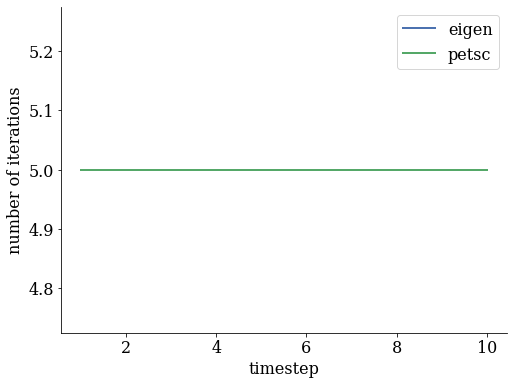

In [15]:
plt.plot(eigen_numiterations["time_step/number"], eigen_numiterations["time_step/iteration_proc0/number"], label="eigen")
plt.plot(petsc_numiterations["time_step/number"], petsc_numiterations["time_step/iteration_proc0/number"], label="petsc")
plt.legend()
plt.xlabel("timestep")
plt.ylabel("number of iterations")

In [16]:
eigen_temp = output_eigen[output_eigen["time_step/iteration_proc0/component_convergence/number"]==0]
petsc_temp = output_petsc[output_petsc["time_step/iteration_proc0/component_convergence/number"]==0]

In [17]:
petsc_it = [i for i in range(len(petsc_temp))]
eigen_it = [i for i in range(len(eigen_temp))]

Text(0, 0.5, 'iteration')

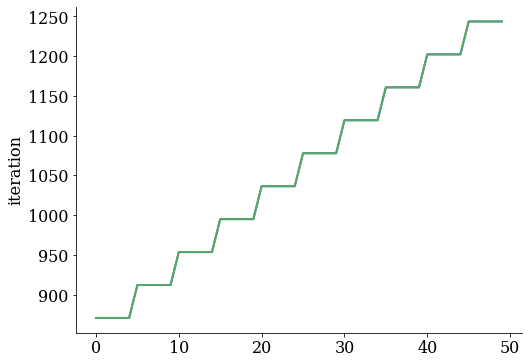

In [18]:
plt.plot(eigen_it, eigen_temp["time_step/iteration_proc0/component_convergence/x"])
plt.plot(petsc_it, petsc_temp["time_step/iteration_proc0/component_convergence/x"])
plt.ylabel("temp")
plt.ylabel("iteration")

In [19]:
eigen_press = output_eigen[output_eigen["time_step/iteration_proc0/component_convergence/number"]==1]
petsc_press = output_petsc[output_petsc["time_step/iteration_proc0/component_convergence/number"]==1]

Text(0, 0.5, 'iteration')

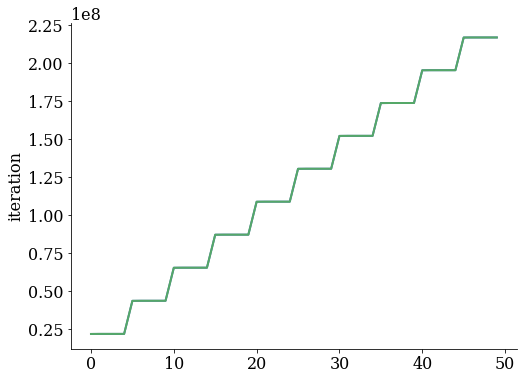

In [20]:
plt.plot(eigen_it, eigen_press["time_step/iteration_proc0/component_convergence/x"])
plt.plot(petsc_it, petsc_press["time_step/iteration_proc0/component_convergence/x"])
plt.ylabel("press")
plt.ylabel("iteration")

In [21]:
eigen_press["time_step/iteration_proc0/component_convergence/x"].head()

1    21760000.0
3    21807000.0
5    21807000.0
7    21807000.0
9    21807000.0
Name: time_step/iteration_proc0/component_convergence/x, dtype: float64

In [22]:
petsc_press["time_step/iteration_proc0/component_convergence/x"].head()

1    21760000.0
3    21807000.0
5    21807000.0
7    21807000.0
9    21807000.0
Name: time_step/iteration_proc0/component_convergence/x, dtype: float64

### Read in Jacobian

In [51]:
jac_eigen_file = directory+"/TRuni_saturated_jacobian_eigen.out"
jac_petsc_file = directory+"/TRuni_saturated_jacobian_petsc.out"

In [52]:
jac_eigen = parse_jacobian(jac_eigen_file, petsc=False)

In [53]:
jac_petsc = parse_jacobian(jac_petsc_file, petsc=True)

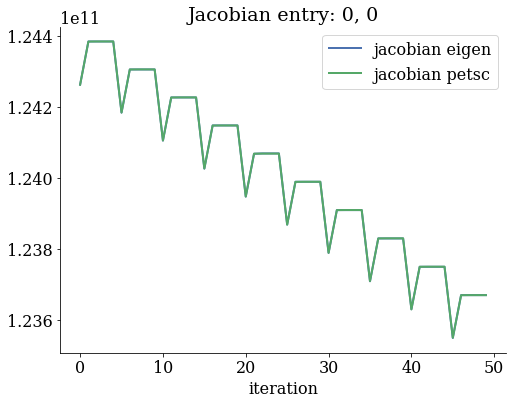

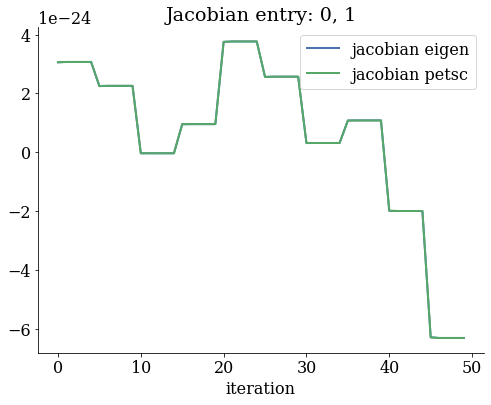

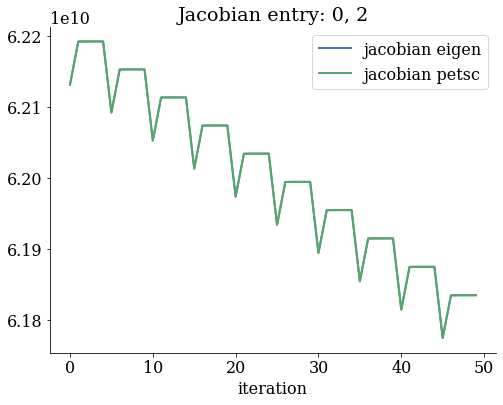

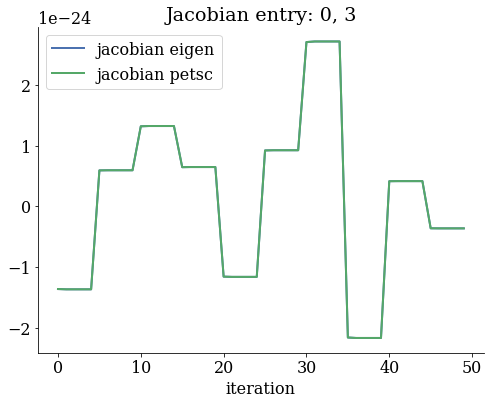

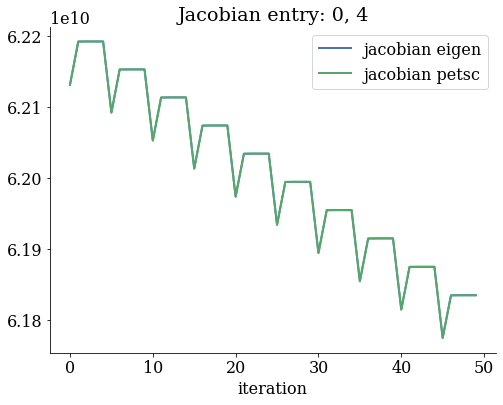

...

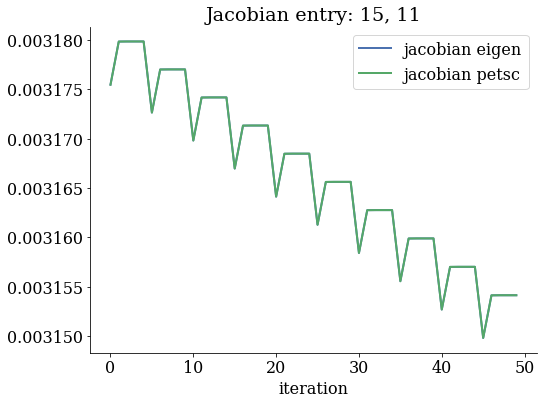

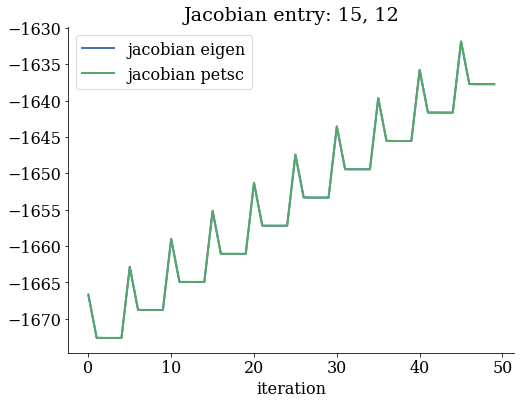

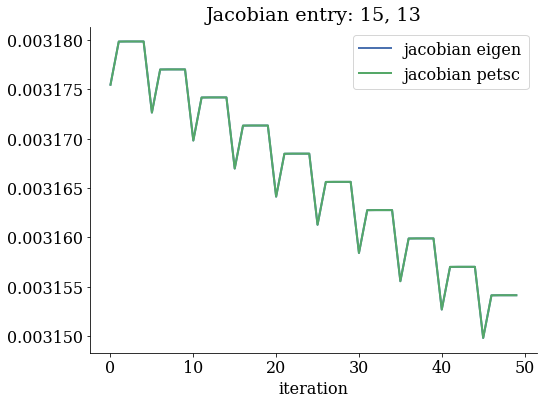

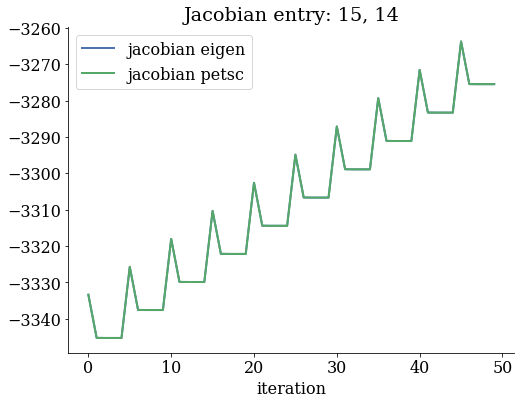

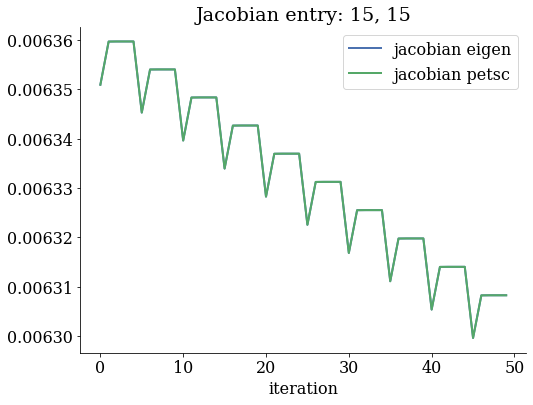

In [54]:
for i in range(16):
    for j in range(16):
        plt.title(f"Jacobian entry: {i}, {j}")
        plt.plot(jac_eigen[i][j], label="jacobian eigen")
        plt.plot(jac_petsc[i][j], label="jacobian petsc")
        plt.legend()
        plt.xlabel("iteration")
        plt.show()

In [55]:
jac_eigen[0][0][:3]

[124263000000.0, 124385000000.0, 124385000000.0]

In [56]:
jac_petsc[0][0][:3]

[124263002059.45387, 124384772932.46571, 124385038330.91025]

# 2. unsaturated case

In [29]:
directory = "../data/sims/TRF"

In [30]:
m = OGS()

PROJECT_FILE not given. Calling it default.prj.


### Read in STDOUT

In [31]:
output_eigen = m.parse_out(directory+"/TRuni_unsaturated_eigen.out")

In [32]:
output_petsc = m.parse_out(directory+"/TRuni_unsaturated_petsc.out", petsc=True)

In [33]:
output_eigen

,execution_time,time_step/number,time_step/t,time_step/dt,time_step/cpu_time,time_step/output_time,time_step/iteration_proc0/number,time_step/iteration_proc0/assembly_time,time_step/iteration_proc0/dirichlet_bc_time,time_step/iteration_proc0/linear_solver_time,time_step/iteration_proc0/cpu_time,time_step/iteration_proc0/component_convergence/number,time_step/iteration_proc0/component_convergence/dx,time_step/iteration_proc0/component_convergence/x,time_step/iteration_proc0/component_convergence/dx_relative
0,0.028253,1,0.1,0.1,0.001446,0.001079,1,0.000491,0.000008,None,0.000552,0,0.000000,870.61,0.000000e+00
1,0.028253,1,0.1,0.1,0.001446,0.001079,1,0.000491,0.000008,None,0.000552,1,469.210000,27815.00,1.686900e-02
2,0.028253,1,0.1,0.1,0.001446,0.001079,2,0.000256,0.000006,None,0.000291,0,0.000000,870.61,0.000000e+00
3,0.028253,1,0.1,0.1,0.001446,0.001079,2,0.000256,0.000006,None,0.000291,1,14.727000,27830.00,5.291700e-04
4,0.028253,1,0.1,0.1,0.001446,0.001079,3,0.000253,0.000005,None,0.000286,0,0.000000,870.61,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,0.028253,10,1.0,0.1,0.001337,0.001038,2,0.000281,0.000006,None,0.000320,1,5.444900,24761.00,2.199000e-04
76,0.028253,10,1.0,0.1,0.001337,0.001038,3,0.000282,0.000006,None,0.000318,0,0.000000,1243.70,0.000000e+00
77,0.028253,10,1.0,0.1,0.001337,0.001038,3,0.000282,0.000006,None,0.000318,1,0.034393,24761.00,1.389000e-06
78,0.028253,10,1.0,0.1,0.001337,0.001038,4,0.000281,0.000006,None,0.000321,0,0.000000,1243.70,0.000000e+00


In [34]:
output_petsc

,execution_time,time_step/number,time_step/t,time_step/dt,time_step/cpu_time,time_step/output_time,time_step/iteration_proc0/number,time_step/iteration_proc0/assembly_time,time_step/iteration_proc0/dirichlet_bc_time,time_step/iteration_proc0/linear_solver_time,time_step/iteration_proc0/cpu_time,time_step/iteration_proc0/component_convergence/number,time_step/iteration_proc0/component_convergence/dx,time_step/iteration_proc0/component_convergence/x,time_step/iteration_proc0/component_convergence/dx_relative
0,0.106871,1,0.1,0.1,0.016394,0.001411,1,0.006630,0.000021,0.001555,0.008239,0,0.000000,8.706100e+02,0.000000e+00
1,0.106871,1,0.1,0.1,0.016394,0.001411,1,0.006630,0.000021,0.001555,0.008239,1,469.210000,2.781500e+04,1.686900e-02
2,0.106871,1,0.1,0.1,0.016394,0.001411,2,0.000872,0.000021,0.000494,0.001417,0,0.000000,8.706100e+02,0.000000e+00
3,0.106871,1,0.1,0.1,0.016394,0.001411,2,0.000872,0.000021,0.000494,0.001417,1,305970.000000,2.781500e+05,1.100000e+00
4,0.106871,1,0.1,0.1,0.016394,0.001411,3,0.000805,0.000020,0.000430,0.001283,0,0.000000,8.706100e+02,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,0.106871,10,1.0,0.1,0.011934,0.001383,3,0.000896,0.000021,0.000495,0.001442,1,115.840000,2.209600e+08,5.242900e-07
100,0.106871,10,1.0,0.1,0.011934,0.001383,4,0.000911,0.000021,0.000448,0.001411,0,0.000000,1.243700e+03,0.000000e+00
101,0.106871,10,1.0,0.1,0.011934,0.001383,4,0.000911,0.000021,0.000448,0.001411,1,0.266220,2.209600e+08,1.204800e-09
102,0.106871,10,1.0,0.1,0.011934,0.001383,5,0.000858,0.000020,0.000449,0.001357,0,0.000000,1.243700e+03,0.000000e+00


In [35]:
eigen_numiterations = output_eigen.drop_duplicates(subset ="time_step/number", keep = "last")

In [36]:
petsc_numiterations = output_petsc.drop_duplicates(subset ="time_step/number", keep = "last")

Text(0, 0.5, 'number of iterations')

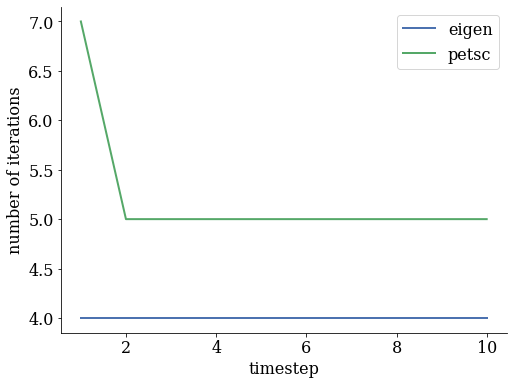

In [37]:
plt.plot(eigen_numiterations["time_step/number"], eigen_numiterations["time_step/iteration_proc0/number"], label="eigen")
plt.plot(petsc_numiterations["time_step/number"], petsc_numiterations["time_step/iteration_proc0/number"], label="petsc")
plt.legend()
plt.xlabel("timestep")
plt.ylabel("number of iterations")

In [38]:
eigen_temp = output_eigen[output_eigen["time_step/iteration_proc0/component_convergence/number"]==0]
petsc_temp = output_petsc[output_petsc["time_step/iteration_proc0/component_convergence/number"]==0]

In [39]:
petsc_it = [i for i in range(len(petsc_temp))]
eigen_it = [i for i in range(len(eigen_temp))]

Text(0, 0.5, 'iteration')

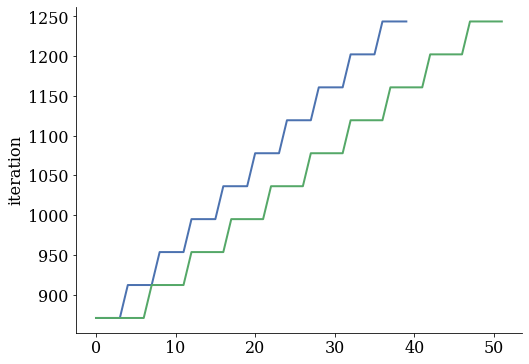

In [40]:
plt.plot(eigen_it, eigen_temp["time_step/iteration_proc0/component_convergence/x"])
plt.plot(petsc_it, petsc_temp["time_step/iteration_proc0/component_convergence/x"])
plt.ylabel("temp")
plt.ylabel("iteration")

In [41]:
eigen_press = output_eigen[output_eigen["time_step/iteration_proc0/component_convergence/number"]==1]
petsc_press = output_petsc[output_petsc["time_step/iteration_proc0/component_convergence/number"]==1]

Text(0, 0.5, 'iteration')

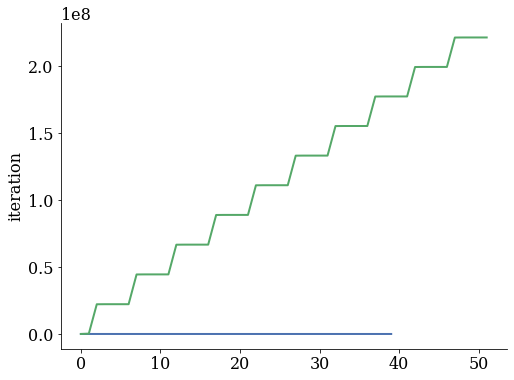

In [42]:
plt.plot(eigen_it, eigen_press["time_step/iteration_proc0/component_convergence/x"])
plt.plot(petsc_it, petsc_press["time_step/iteration_proc0/component_convergence/x"])
plt.ylabel("press")
plt.ylabel("iteration")

In [43]:
eigen_press["time_step/iteration_proc0/component_convergence/x"].head()

1    27815.0
3    27830.0
5    27830.0
7    27830.0
9    27392.0
Name: time_step/iteration_proc0/component_convergence/x, dtype: float64

In [44]:
petsc_press["time_step/iteration_proc0/component_convergence/x"].head()

1       27815.0
3      278150.0
5    22161000.0
7    22211000.0
9    22211000.0
Name: time_step/iteration_proc0/component_convergence/x, dtype: float64

### Read in Jacobian

In [45]:
jac_eigen_file = directory+"/TRuni_unsaturated_jacobian_eigen.out"
jac_petsc_file = directory+"/TRuni_unsaturated_jacobian_petsc.out"

In [46]:
jac_eigen = parse_jacobian(jac_eigen_file, petsc=False)

In [47]:
jac_petsc = parse_jacobian(jac_petsc_file, petsc=True)

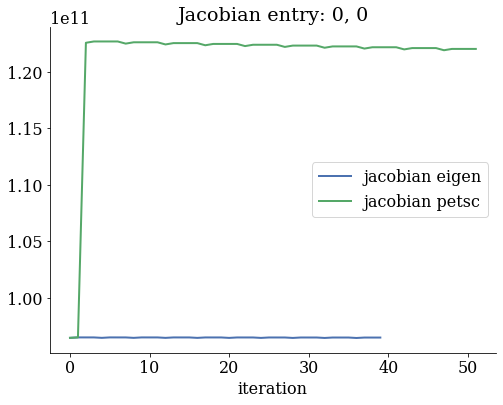

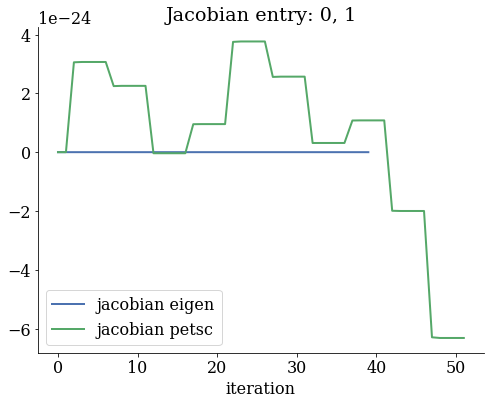

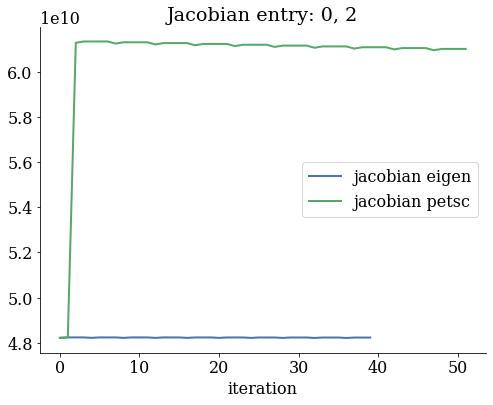

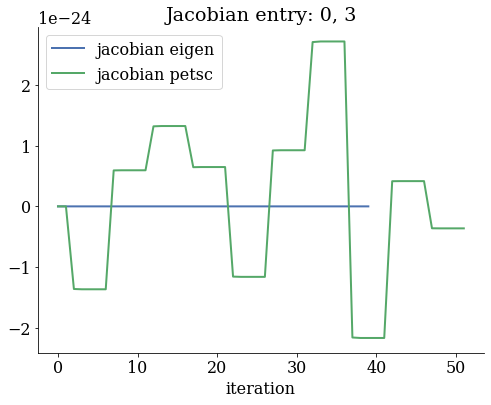

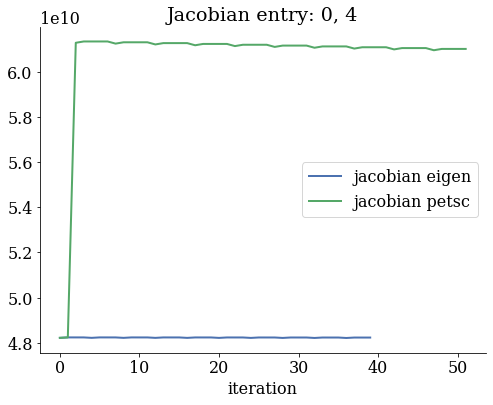

...

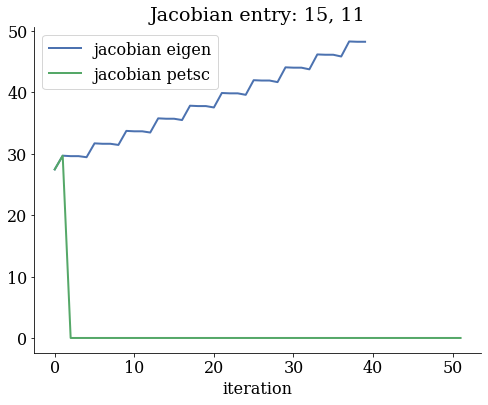

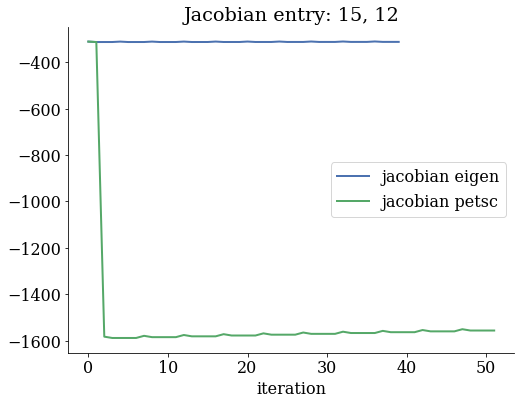

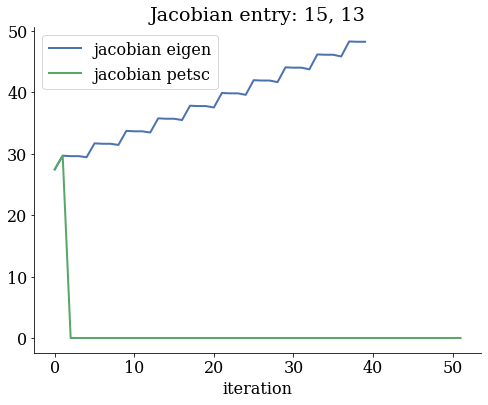

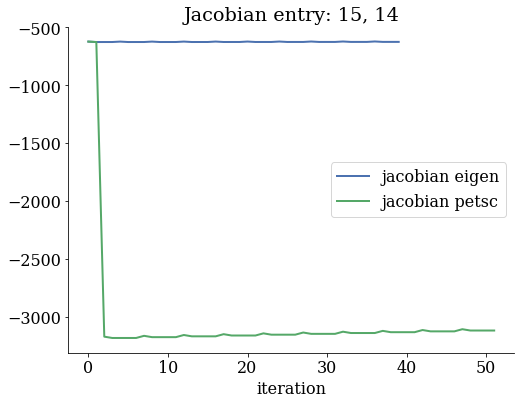

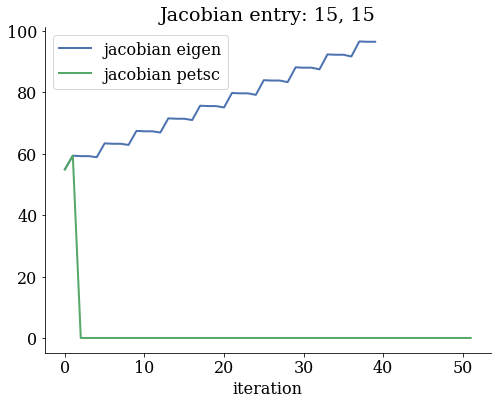

In [48]:
for i in range(16):
    for j in range(16):
        plt.title(f"Jacobian entry: {i}, {j}")
        plt.plot(jac_eigen[i][j], label="jacobian eigen")
        plt.plot(jac_petsc[i][j], label="jacobian petsc")
        plt.legend()
        plt.xlabel("iteration")
        plt.show()

In [49]:
jac_eigen[0][0][:3]

[96435200000.0, 96473800000.0, 96472500000.0]

In [50]:
jac_petsc[0][0][:3]

[96435238198.63756, 96473760114.15456, 122554116528.06126]